# End-to-end-Multiclass Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

> `https://www.kaggle.com/c/dog-breed-identification/data` 

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

> `https://www.kaggle.com/c/dog-breed-identification/overview/evaluation`

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's prbably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10K+ Images in the training set (These images have labels)
* There are around 10K+ Images in the test set( These images have no labels, because we'll want to predict them)

In [1]:
# Unzipping the data  into google drive
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision"

### Get our workspace ready

### Get our workspace ready

* Import TensorFlow 2.X
* Import TensorFlow Hub
* Make sure you're using a GPU

In [2]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version: ", tf.__version__)
print("TF Hub Version: ", hub.__version__)

# Check GPU availability
print("GPU", "available (YESSSSSS!!!!)"if tf.config.list_physical_devices("GPU") else "not availabl :(")

TF Version:  2.7.0
TF Hub Version:  0.12.0
GPU available (YESSSSSS!!!!)


## Getting our data ready (turning into tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors(numerical representations).

In [3]:
# Checkout the labels of our data 
import pandas as pd
import numpy as np

labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [4]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


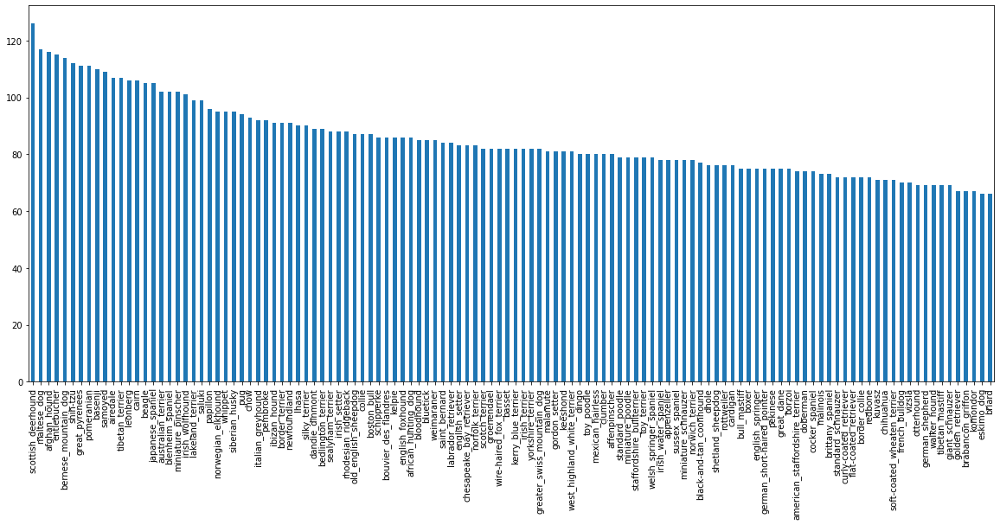

In [5]:
# How many images are there for each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,8))

In [6]:
labels_csv["breed"].value_counts().median()

82.0

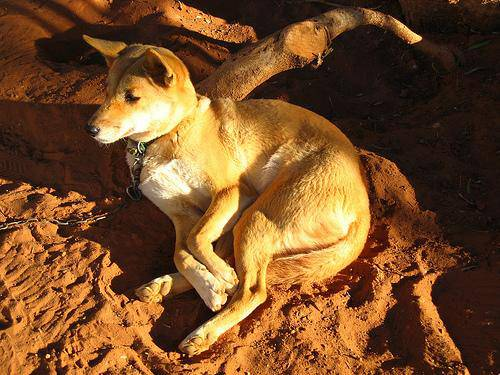

In [7]:
# Let's view the image
from IPython.display import Image

Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames.

In [8]:
# Create path names from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/"+ fname + ".jpg"for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
# Check whether the number of filenames match the number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match the actual amount of files!!! Proceed")
else:
  print("Filenames do not match the actual amount of files , Check again! ")

Filenames match the actual amount of files!!! Proceed


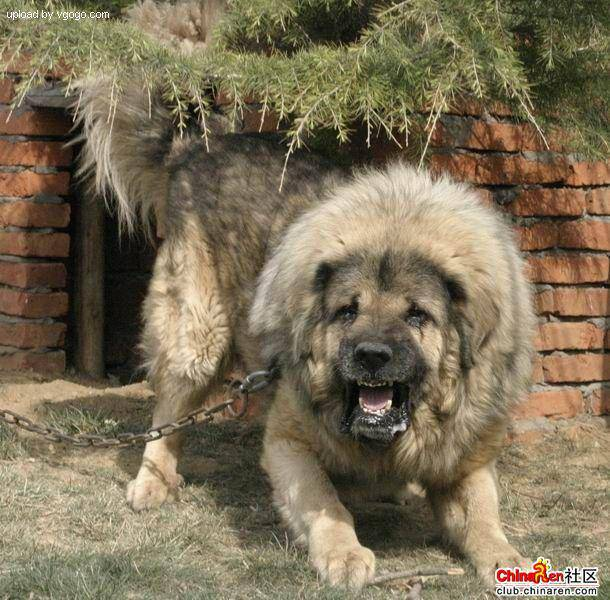

In [10]:
# Let's check one more time
Image(filenames[9000])

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [11]:
# Turning labels into arrays
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels) # Does the same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
len(labels)

10222

In [13]:
# See if we number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames")
else:
  print("Number of labels do not match the number of filenames! Check Again")

Number of labels matches the number of filenames


In [14]:
# Find the unique label values 
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [15]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
# Turn a single label into an array of boolean
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [17]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(boolean_labels)

10222

In [19]:
# Example: Turning boolean array into integers

print(labels[0])# Original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # There will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

Since the datset from Kaggle doesn't come with a validation set, we're going to create our own.

In [20]:
# Setup X & y variable

X = filenames
y = boolean_labels

In [21]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [22]:
# Set number of images to use for experimenting 
NUM_IMAGES = 1000 #@param{type:"slider", min: 1000, max:10000, steps:1000}

In [23]:
# Let's split our data into train and validation
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train , X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size=0.2,
                                                   random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [24]:
# Let's have a gaze at the training data
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images (Turning images into Tensors)

To preprocess our images into tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tenserflow to read the file and save it to a variable `image`.
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`.

Before we do, let's see what importing an image looks like.

In [25]:
# Convert an image to numpy array 
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [26]:
image.max(), image.min()

(255, 0)

In [27]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [28]:
# Turn image into tensor
tf.constant(image)[0:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks likeas Tensor let's make a function to preprocess them.
1. Take an image filepath as input
2. Use Tenserflow to read the file and save it to a variable `image`.
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`.

In [29]:
# Before Moving Forward If you are confused what this function does, Best practice is to just check line by line code in next cell
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, image_size = IMG_SIZE):
  """
  Takes an image filepath and turns the image into a Tensor.
  """
  # Read in an image
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the colour channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value 
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image




## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go...they all migh not fit into memory.

So that's why we do about 32 (this is batch size) images at a time (you can manaually adjust the batch size if need be).

In order to use TenserFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [30]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [31]:
# Demo of the above
(process_image (X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way  to turn our data into tuples of Tensors in the form : `(image, label)`, let's make a function to turn all of our data `(X & y)` into batches!

In [32]:
# Define the batch size, 32 is a good sizefilenames
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X,y=None, batch_size= BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # IF the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # Filepaths
                                               tf.constant(y)))# Labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches....")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before image mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [33]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches....
Creating validation data batches...


In [34]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now into batches , however, these these can be a little hard to understand/comprehend , let's visualize them!

In [35]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from data batch
  """
  # Setup the figure
  plt.figure(figsize=(16,10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots
    ax = plt.subplot(5,5, i+1)
    # diplay an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid linesoff
    plt.axis("off")

In [36]:
train_images, train_labels = next(train_data.as_numpy_iterator())

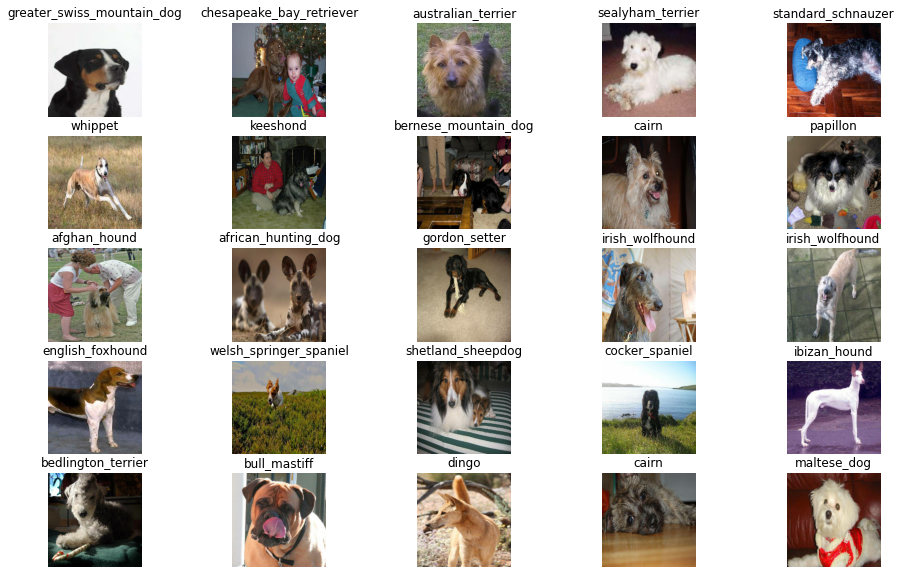

In [37]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

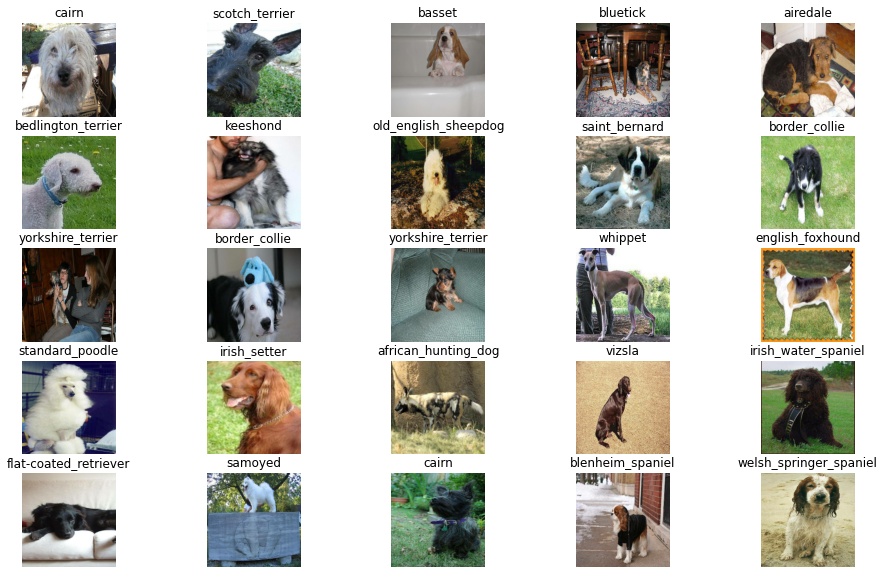

In [38]:
# Let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define

* The input shape (our images shape, in form of Tensors) to our model.
* The output shape(image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [39]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, colour channels


# Setup output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL form tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into Keras deep learning model!

Knowing this, Let's create a function which:
* Takes the input shape, output shape and the  model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here - https://www.tensorflow.org/guide/keras/

In [40]:
# Create a function which builds a Keras model.
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with", MODEL_URL)

  # Setup model layers
  model = tf.keras.Sequential([
     hub.KerasLayer(MODEL_URL), # Layer1 (input layer)
     tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                           activation="softmax") # Layer2 (output layer)
  ])

  # Compile the model
  model.compile(metrics="accuracy")
  model.compile(optimizer="Adam")
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy())
  # Build a model
  model.build(INPUT_SHAPE)

  return model

In [41]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callback

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks:
1. One for TensorBoard which helps track our models progress.
2. One for for early stopping which prevents our model from training for too long.

### TensorBoard Callbacks
To setup a tenserboard callbacks
1. Load the tensorboard notebook extension
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's `fit` function.
3. Visualize our models training logs with the `%tensorboard` magic function.

In [42]:
# Load Tensorboard notebook extension
%load_ext tensorboard

import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():

  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping callback
Early stopping helps to stop our model from overfitting by stopping training if a certain evaluation metric stops improving.


In [43]:
# Create eartly stopping callback

early_stopping  = tf.keras.callbacks.EarlyStopping(monitor="val_loss",
                                                   patience=3)

## Training a model(on subset of data)
Our first model is only going to train  on 1000 images, to make sure everything is working.

In [44]:
NUM_EPOCHS = 100 #@param{type:"slider", min:10, max:100, step:10}

In [45]:
# Check to make sure we are still running GPU
print("GPU", "Available (Yesss!!)"if tf.config.list_physical_devices("GPU") else "Not Found" )

GPU Available (Yesss!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epocs to train for(NUM_EPOCS) and the callbacks we'd like to use
* Return the model


In [46]:
# Build  a function  to train  and return  a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create a tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data  passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping],
            )
  # Return the fitted model
  return model

In [47]:
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 174s 6s/step - loss: 4.2178 - val_loss: 3.1625
Epoch 2/100
25/25 [==============================] - 5s 188ms/step - loss: 1.6547 - val_loss: 2.1804
Epoch 3/100
25/25 [==============================] - 5s 187ms/step - loss: 0.6891 - val_loss: 1.7213
Epoch 4/100
25/25 [==============================] - 5s 184ms/step - loss: 0.2996 - val_loss: 1.4795
Epoch 5/100
25/25 [==============================] - 5s 189ms/step - loss: 0.1336 - val_loss: 1.3366
Epoch 6/100
25/25 [==============================] - 5s 190ms/step - loss: 0.0625 - val_loss: 1.2635
Epoch 7/100
25/25 [==============================] - 5s 185ms/step - loss: 0.0315 - val_loss: 1.2753
Epoch 8/100
25/25 [==============================] - 4s 175ms/step - loss: 0.0160 - val_loss: 1.2137
Epoch 9/100
25/25 [==============================] - 5s 190ms/step - loss: 0.0086 - val_loss: 1.2044


**Questoin:** It looks like our model is overfitting because it's performing  far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep neural networks?

**Note:** Overfitting to begin with is a good thing! it means our model is learning.

### Checking The TensorBoard logs

The TensorBoard magic function(`%tensorboard`)will access the logs directory we created earlier and visualize its contens.

In [48]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions  using a trained model

In [49]:
# Make predictions on the validation data (not used to train on)

predictions = model.predict(val_data, verbose=1)
predictions


7/7 [==============================] - 2s 149ms/step


array([[4.9955357e-05, 1.2071190e-05, 1.2476812e-04, ..., 3.3689430e-05,
        1.2363232e-06, 4.4018799e-04],
       [2.4485435e-05, 2.2252438e-05, 5.4338179e-04, ..., 1.6205739e-05,
        5.4912522e-05, 7.7797959e-06],
       [2.4580874e-07, 2.4957373e-07, 5.8184287e-07, ..., 1.3785210e-06,
        1.6421629e-06, 9.0619469e-06],
       ...,
       [1.0393331e-07, 2.7342438e-07, 3.3075517e-07, ..., 8.2595204e-07,
        9.3573490e-06, 1.1190488e-06],
       [6.0196745e-04, 2.4384204e-05, 5.7463881e-06, ..., 3.1239371e-05,
        3.1071688e-06, 2.7142749e-03],
       [1.2472407e-04, 2.6936880e-06, 5.2752806e-05, ..., 1.3332365e-03,
        9.6357333e-05, 2.4115030e-05]], dtype=float32)

In [50]:
predictions.shape

(200, 120)

In [51]:
predictions[0]

array([4.99553571e-05, 1.20711902e-05, 1.24768121e-04, 2.50392350e-06,
       1.05754290e-04, 1.19851811e-05, 3.06112459e-03, 3.02467553e-04,
       2.62692993e-05, 1.46501072e-04, 1.48098889e-05, 2.65997005e-05,
       1.93474392e-04, 3.09601237e-05, 3.47964597e-05, 1.36124028e-04,
       1.04748678e-05, 3.86756241e-01, 9.22332163e-07, 1.84704259e-05,
       1.24224316e-04, 9.92518380e-06, 1.27850512e-07, 1.13362177e-04,
       5.98528868e-06, 7.59372415e-05, 2.27302194e-01, 7.78323647e-06,
       1.30961649e-04, 6.85516497e-05, 1.38032165e-05, 6.27767877e-04,
       4.52797074e-04, 1.86510715e-06, 3.66212880e-05, 2.89746877e-02,
       3.83307679e-06, 3.97947995e-04, 1.50779697e-05, 1.04593200e-04,
       3.12289834e-04, 4.85658938e-06, 1.21129080e-04, 5.50358323e-04,
       1.25791394e-06, 2.05310243e-05, 8.80308733e-07, 9.15403361e-05,
       6.44642510e-04, 8.60168293e-05, 2.27044366e-05, 1.15563707e-05,
       1.78045902e-05, 1.03056431e-04, 1.80539373e-05, 4.51886808e-06,
      

In [52]:
np.sum(predictions[2])

0.9999998

In [53]:
# First prediction
index = 6

print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}" )
print(f"Sum: {np.sum(predictions[index])}" )
print(f"Max index: {np.argmax(predictions[index])}" )
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}" )


[1.5651853e-05 3.4185420e-04 1.5025751e-03 3.5841728e-07 6.0805933e-06
 2.0942815e-04 7.8750548e-07 1.1660845e-05 1.0222357e-07 8.1637963e-06
 1.6385222e-07 2.3823926e-05 9.5373853e-06 5.1170919e-06 2.5683792e-05
 4.9894916e-06 3.9856025e-04 2.1397871e-05 9.5294035e-06 9.9083491e-06
 1.3334051e-06 6.4196951e-07 3.6770421e-06 3.5673594e-08 2.9456074e-04
 2.6880081e-05 2.4638255e-06 1.2662456e-06 4.1357853e-05 2.0314876e-03
 1.1144247e-06 5.6600552e-06 3.5031600e-05 3.8737603e-02 2.4922207e-05
 1.7107878e-04 2.7465364e-06 1.2989288e-05 3.0110466e-05 7.6777064e-07
 1.7134083e-04 1.0794582e-07 9.6087373e-05 1.5287020e-05 1.0570231e-05
 7.5959083e-06 4.3698619e-06 1.0027154e-03 1.9706948e-05 2.3525618e-06
 4.9237397e-06 2.9942605e-05 3.1642042e-04 1.2055521e-07 8.2518533e-04
 3.3835062e-07 6.6893256e-07 6.6432223e-04 2.2324882e-04 2.7374458e-03
 1.3985083e-04 1.5510912e-02 5.7179695e-01 4.7226877e-05 7.6964925e-06
 6.9603534e-06 2.6048448e-05 6.8341892e-06 3.2610578e-06 2.8768403e-03
 4.321

Having the above functionality is greate but we want to be able to do it at scale.

And it would be even better if we could see the image prediction is being made on!

**Note:** Predictions probabilities are also known as confidence levels.


In [54]:
# Turn predictions probabilities into their respective label( easier to understand )

def get_pred_label(prediction_probabilities):

  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of prediciton proababilities
pred_label = get_pred_label(predictions[9])
pred_label

'collie'

Now since our validation data is still in a batch dataset,
We'll have to unbatchify it to make predictions on the validation images and then compare those predictions to validation labels(truth labels)

In [55]:
# Create a function to unbatch dataset
def unbatchify(data):
  """
  Takes a batch dataset of (image, label) Tensors and returns separate arrays images and labels
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [56]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array  of truth labels and an array of image and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [57]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if  the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted label, probablitiy of prediction & truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

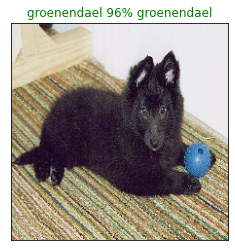

In [58]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
           n=77)

Now we've got one function to visualize our models top prediction, let's make view of our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the predictive label using `get_pred_label`.
* Find the top 10:
 * Prediction probabilities indexes
 * Prediction probabilities values
 * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [59]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change the color of true labels
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

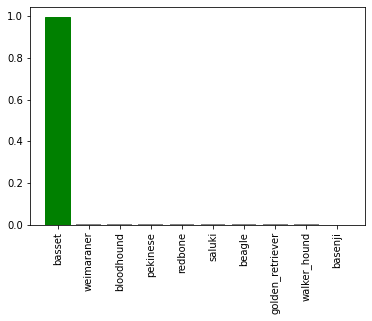

In [60]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=2)

Now we've got some function to help us visualize our predicitons and evaluate our model, let's check out a few.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


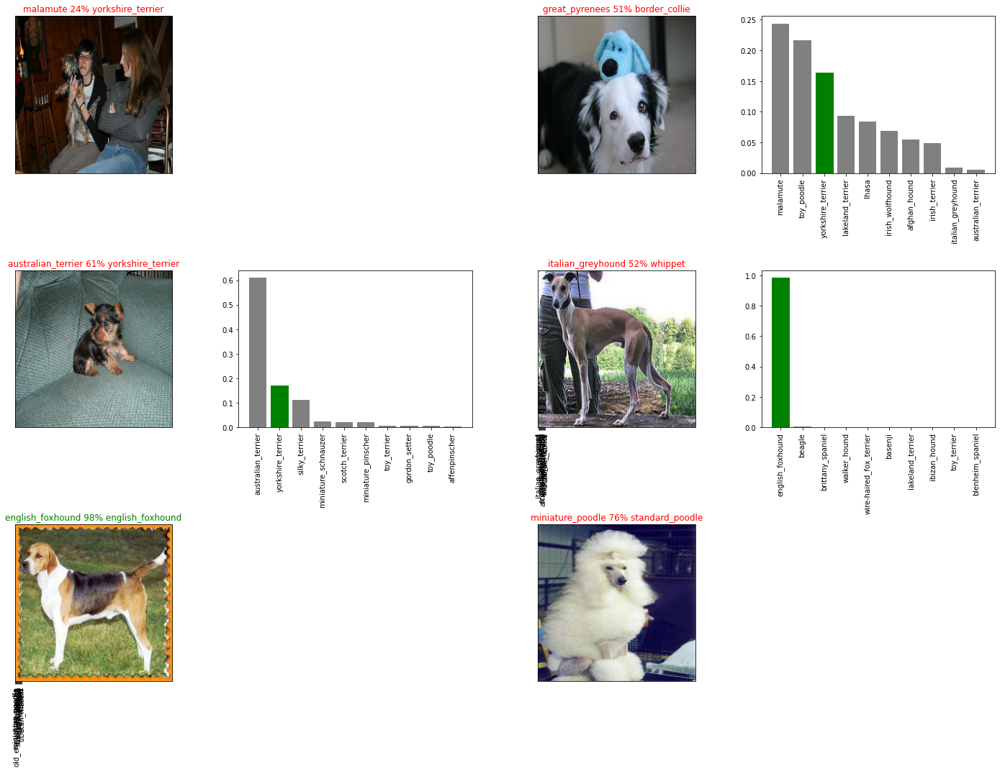

In [61]:
# Let's check out  a few predictions and their different values
i_multiplier = 10

# Defining the number of rows (in our case it's 3) 
num_rows = 3

# Defining the number of columns (we have 2 columns)
num_cols = 2

# Number of images we wanted to display (3 x 2 = 6 images)
num_images = num_rows*num_cols

# Defining our figure size(will increase or decrease the plot size depends on ur values)
plt.figure(figsize=(10*num_cols, 5*num_rows))

# Now it's time to iterate or construct a loop to plot each images (6) and plot them as we want. 
# We have to plot our prediction image on one side and prediction confidences on the other side of the plot. 
# To make this possible we use subplots (will attach a image below check em)

for i in range(num_images):# In our case 6 images
  plt.subplot(num_rows, # our rows
              2*num_cols,# Since we wanna display two different plots in one one whole plot
              2*i+1)# helps to plot in order (from left to right one by one)

  # What we want to display? It's our prediction image 
  plot_pred(prediction_probabilities=predictions,# Grabbing our predictions
            labels=val_labels,# Our true labels / test labels
            images=val_images,# Our true images / test images
            n=i+i_multiplier) # n will be the indexer we use (will explain in brief)

  # Now we want to plot our prediction confidence comparing our true label
  plt.subplot(num_rows,
              2*num_cols,
              2+i+2)# It's 2 at the end because we're plotting the other half side we created 
 
  # What we want to display in other half we created using 2*num_cols? 
  # It's our prediction confidence
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  
# Slight Adjustment in displaying 
plt.tight_layout(h_pad=1.0)

# To show plot
plt.show()

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloding a trained model

In [62]:
# Create  a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save the format

  print(f"Saving model to:{model_path}....")
  model.save(model_path)
  
  return model_path

In [63]:
# Create a function to load a model
def load_model(model_path):
  """
  Loads a save model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got  functions to save and load a trained model, let's make sure they work

In [65]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to:drive/MyDrive/Dog Vision/models/20220215-06501644907859-1000-images-mobilenetv2-Adam.h5....


'drive/MyDrive/Dog Vision/models/20220215-06501644907859-1000-images-mobilenetv2-Adam.h5'

In [66]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20220215-06501644907859-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20220215-06501644907859-1000-images-mobilenetv2-Adam.h5


In [67]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 2s 197ms/step - loss: 1.2470


1.2470165491104126

In [69]:
# Evaluate the loaded model 
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 164ms/step - loss: 1.2470


1.2470165491104126

## Training  a big dog model 🐶 (on the full data)

In [70]:
len(X), len(y)

(10222, 10222)

In [71]:
# Create  a data batch with the full data set
full_data = create_data_batches(X,y)

Creating training data batches....


In [72]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [73]:
# Create  a model for full data 
full_model = create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


**Note:** Running the cell below will take little while  (Maybe upto 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory

In [82]:
# Create full model call backs
full_model_tensorboard = create_tensorboard_callback()

# No Validation set when training on all data , we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="loss",
                                                             patience=3)

In [83]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 44s 136ms/step - loss: 0.0969
Epoch 2/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0755
Epoch 3/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0587
Epoch 4/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0482
Epoch 5/100
320/320 [==============================] - 45s 141ms/step - loss: 0.0400
Epoch 6/100
320/320 [==============================] - 45s 141ms/step - loss: 0.0338
Epoch 7/100
320/320 [==============================] - 45s 141ms/step - loss: 0.0275
Epoch 8/100
320/320 [==============================] - 45s 140ms/step - loss: 0.0235
Epoch 9/100
320/320 [==============================] - 46s 143ms/step - loss: 0.0187
Epoch 10/100
320/320 [==============================] - 46s 142ms/step - loss: 0.0168
Epoch 11/100
320/320 [==============================] - 45s 141ms/step - loss: 0.0152
Epoch 12/100
320/320 [==============================] - 43s 133

In [84]:
save_model(full_model, suffix="full_model-image-set-mobilenetv2-Adam")

Saving model to:drive/MyDrive/Dog Vision/models/20220215-07501644911455-full_model-image-set-mobilenetv2-Adam.h5....


'drive/MyDrive/Dog Vision/models/20220215-07501644911455-full_model-image-set-mobilenetv2-Adam.h5'

In [85]:
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20220215-07501644911455-full_model-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20220215-07501644911455-full_model-image-set-mobilenetv2-Adam.h5


## Making predictions on test dataset

Since our model has been trained on images in the form of Tensor Batches, to make predictions on test data , we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches. 

To make predictions on the test data, we'll:
* Get the test image filename
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (Since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called our model.

In [87]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/dea5b2d047b3cb7ce13234140c7bf5aa.jpg',
 'drive/MyDrive/Dog Vision/test/df903a0522873bebca93d1d93bc60bc4.jpg',
 'drive/MyDrive/Dog Vision/test/deb66780609abfef7f5048df02149839.jpg',
 'drive/MyDrive/Dog Vision/test/e379ba26a5e2e22e85975b839e0e401b.jpg',
 'drive/MyDrive/Dog Vision/test/dd8d95720349f85d2a795adaafc71172.jpg',
 'drive/MyDrive/Dog Vision/test/e5ba665e01b6927411d60158f28160dd.jpg',
 'drive/MyDrive/Dog Vision/test/e35b90290702042d17ceee2aaf2d1475.jpg',
 'drive/MyDrive/Dog Vision/test/e2537e98808877c707bfe8ca53e303b7.jpg',
 'drive/MyDrive/Dog Vision/test/e79030be9c9769f3604474aea16039bd.jpg',
 'drive/MyDrive/Dog Vision/test/e2d76a91641c11a0609687b83ff9c0b4.jpg']

In [88]:
len(test_filenames)

10357

In [89]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [90]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take long time to run (about an ~1hour).

In [92]:
# Make prediciton on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 3227s 10s/step


In [93]:
# Save Predictions (NumPy array) to CSV file for access later
np.savetxt("drive/MyDrive/Dog Vision/pred_arrays.csv", test_predictions,delimiter=",")

In [ ]:
# Load Predictions CSV File
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/pred_arrays.csv", delimiter=",")

In [94]:
test_predictions[:10]

array([[2.2899817e-08, 7.7678432e-16, 3.2320354e-08, ..., 1.1554388e-02,
        2.7277302e-02, 2.0305302e-08],
       [2.7505530e-12, 7.0562620e-13, 3.8117080e-15, ..., 2.5229626e-15,
        3.9431389e-14, 9.4294368e-09],
       [2.6457000e-17, 1.4800484e-11, 8.4943879e-16, ..., 2.4991652e-07,
        8.2584293e-08, 8.2471772e-11],
       ...,
       [1.3755421e-22, 1.7791896e-20, 5.3625049e-24, ..., 9.8847477e-22,
        7.1077877e-19, 3.6190773e-18],
       [4.1084206e-07, 1.3764128e-12, 3.7296381e-11, ..., 3.3509814e-08,
        1.4020234e-06, 4.9535679e-06],
       [3.5032086e-10, 2.0516762e-09, 5.3434314e-12, ..., 1.1263297e-08,
        1.0208125e-11, 1.0012352e-13]], dtype=float32)

In [96]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the kaggle sample submission, we find that it wants our models prediction probability outputs in a Dataframe with an ID and a column for each different dog breed:
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll create:
* Create a pandas dataframe with ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV file to submit to Kaggle.

In [100]:
# Create a pandas dataframe with empty columns
pred_df = pd.DataFrame(columns=['id']+ list(unique_breeds))
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [105]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
pred_df['id'] = test_ids

In [106]:
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dea5b2d047b3cb7ce13234140c7bf5aa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df903a0522873bebca93d1d93bc60bc4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,deb66780609abfef7f5048df02149839,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e379ba26a5e2e22e85975b839e0e401b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dd8d95720349f85d2a795adaafc71172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [108]:
# Add the prediction probabilities to each dog breed column
pred_df[list(unique_breeds)] = test_predictions
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dea5b2d047b3cb7ce13234140c7bf5aa,2.289982e-08,7.767843e-16,3.232035e-08,2.021988e-09,3.690040e-07,9.313964e-05,7.235526e-12,4.508254e-12,4.796873e-07,1.370774e-08,6.981310e-08,2.487821e-07,2.202816e-09,9.967701e-08,2.313875e-12,2.313305e-09,7.660734e-05,1.620878e-13,3.545506e-09,2.024131e-08,6.650542e-06,1.700890e-09,2.771724e-08,4.387297e-08,6.974346e-09,3.942121e-11,3.710093e-09,4.346834e-11,4.136932e-10,2.331680e-09,7.427449e-10,1.476827e-08,2.484506e-11,1.964082e-08,1.299517e-08,1.825708e-04,4.776227e-09,1.547666e-11,2.361312e-09,...,5.509490e-11,1.591178e-09,1.356147e-06,4.418520e-08,2.723550e-10,3.239289e-07,8.810599e-09,4.322372e-10,6.310133e-08,7.933222e-12,1.917196e-07,1.127184e-10,1.536923e-08,2.240346e-12,8.509354e-08,2.261526e-11,7.722685e-06,8.845237e-01,4.492061e-03,1.030350e-09,5.837207e-09,1.035558e-07,3.148866e-12,1.074268e-05,5.744852e-07,9.543885e-08,4.510823e-06,4.195754e-09,1.035562e-08,4.752397e-14,1.549378e-09,3.090501e-08,7.811723e-11,2.565271e-07,1.752125e-06,4.805267e-12,8.977907e-05,1.155439e-02,2.727730e-02,2.030530e-08
1,df903a0522873bebca93d1d93bc60bc4,2.750553e-12,7.056262e-13,3.811708e-15,1.341487e-12,2.438778e-14,4.865254e-11,6.550680e-09,1.043868e-13,1.408837e-13,1.148508e-11,3.304427e-14,3.054508e-12,3.218755e-15,6.113865e-13,9.607110e-13,3.819621e-14,2.119078e-13,8.969809e-19,8.966564e-18,9.578147e-09,2.291300e-17,1.086355e-15,1.439956e-15,1.656098e-12,1.031997e-12,2.199605e-08,3.896035e-13,1.373878e-12,5.104814e-15,3.819435e-16,4.538148e-16,1.186365e-15,1.501211e-16,5.350396e-13,4.464734e-19,2.467189e-15,3.865773e-14,6.733588e-15,3.268948e-13,...,4.790165e-14,1.166685e-16,6.894608e-16,2.619583e-17,5.915589e-12,6.991125e-14,5.478795e-12,4.578440e-15,6.538552e-15,2.481172e-12,3.968135e-10,1.570700e-14,1.060001e-11,2.458949e-12,1.504539e-13,2.812010e-14,9.263775e-16,7.716251e-12,4.651604e-15,3.523470e-12,2.811659e-12,2.364369e-12,9.999998e-01,4.942732e-17,1.075485e-09,2.371704e-12,2.001716e-13,3.092645e-10,1.423146e-13,2.269858e-11,8.111386e-12,1.457234e-16,1.029461e-12,2.307462e-13,2.120894e-16,9.321780e-10,2.006782e-16,2.522963e-15,3.943139e-14,9.429437e-09
2,deb66780609abfef7f5048df02149839,2.645700e-17,1.480048e-11,8.494388e-16,6.566487e-15,1.450896e-10,1.638184e-10,4.736204e-13,6.797533e-14,2.685112e-15,7.557369e-09,8.112789e-10,5.327681e-12,9.468668e-14,9.339076e-11,1.926180e-15,8.234980e-11,3.128028e-13,3.294439e-15,1.027634e-06,4.710490e-14,3.465259e-17,3.016834e-15,1.121503e-11,9.488348e-12,7.671490e-17,1.542764e-17,4.284594e-09,3.569844e-11,5.075326e-09,2.774057e-16,1.810905e-18,2.601481e-12,1.327745e-10,1.651766e-06,1.051026e-11,3.308811e-07,2.690368e-18,8.885003e-18,1.020352e-06,...,4.641566e-14,7.027296e-12,2.543299e-08,3.405364e-14,8.161522e-10,1.558778e-16,2.861170e-13,8.469429e-19,3.143072e-15,1.072065e-13,2.061135e-08,7.380694e-10,6.861525e-12,1.508358e-12,1.012558e-08,3.368439e-14,1.611

In [110]:
# Save our predictions dataframe csv for submission to Kaggle
pred_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission-1.csv",index=False)